# Gradient Descent Animation in Jupyter

This Jupyter Notebook demonstrates the animation of the Gradient Descent algorithm across multiple mathematical functions. The codes utilizes a wrapper class to create animations.

The implementation of using wrapper class is taken as reference from [Gradient Descent Animation](https://github.com/aniketripathi/Gradient-Descent-Animation) GitHub repository.

Explore how gradient descent progresses toward the minimum of various functions, visually represented for a deeper understanding.


### Required Libraries

1. **NumPy**
2. **Matplotlib**
3. **mpl_toolkits.mplot3d**
4. **Plotly**
5. **os**

### The interactive tool sometimes does not update with changes in the parameters due to stored memory in the kernel. Try restarting the kernel and running the code with the required changes.

---

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from matplotlib.animation import FuncAnimation
import os

## Visualising Gradient Descent in a system of equations

#### Saved as gradient4.gif

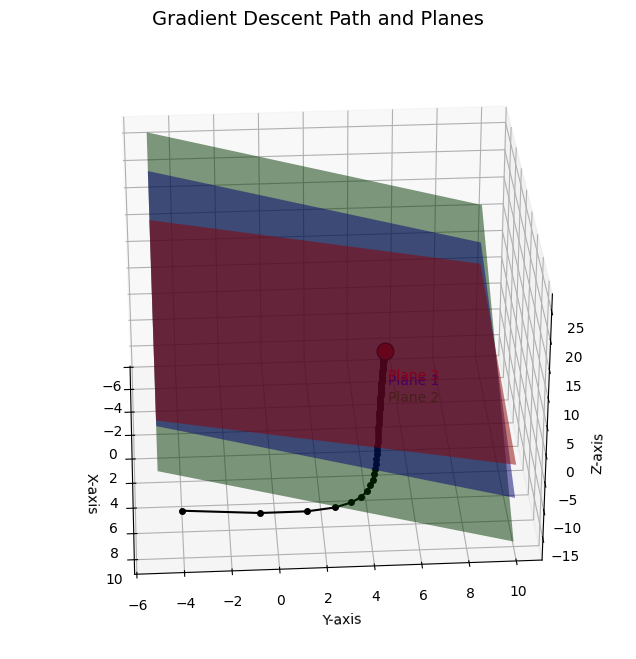

In [5]:
# Define the equations
def eq1(x, y, z): return x + y + z - 10  # First plane
def eq2(x, y, z): return 2 * x + y + z - 12  # Second plane
def eq3(x, y, z): return x + 2 * y + 3 * z - 18  # Third plane

# Gradient function
def grad_f(x, y, z):
    df_dx = 2 * eq1(x, y, z) + 4 * eq2(x, y, z) + 2 * eq3(x, y, z)
    df_dy = 2 * eq1(x, y, z) + 2 * eq2(x, y, z) + 4 * eq3(x, y, z)
    df_dz = 2 * eq1(x, y, z) + 2 * eq2(x, y, z) + 6 * eq3(x, y, z)
    return np.array([df_dx, df_dy, df_dz])

# Parameters for Gradient Descent
alpha = 0.01
tolerance = 1e-6
max_iters = 100
initial = np.array([8, -4, -15])

# Perform Gradient Descent
trajectory = [initial]
x, y, z = initial
for _ in range(max_iters):
    grad = grad_f(x, y, z)
    new_x, new_y, new_z = x - alpha * grad[0], y - alpha * grad[1], z - alpha * grad[2]
    trajectory.append([new_x, new_y, new_z])
    if np.linalg.norm([new_x - x, new_y - y, new_z - z]) < tolerance:
        break
    x, y, z = new_x, new_y, new_z

# Extract trajectory points
traj_x = [point[0] for point in trajectory]
traj_y = [point[1] for point in trajectory]
traj_z = [point[2] for point in trajectory]

# Create grid for planes
x_vals = np.linspace(-5, 10, 100)
y_vals = np.linspace(-5, 10, 100)
X, Y = np.meshgrid(x_vals, y_vals)
Z1 = 10 - X - Y
Z2 = (12 - 2 * X - Y)
Z3 = (18 - X - 2 * Y) / 3

# Plotting and Animation
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot planes with annotations
ax.plot_surface(X, Y, Z1, alpha=0.5, color='blue', rstride=100, cstride=100)
ax.text(5, 5, 10 - 5 - 5, 'Plane 1', color='blue', fontsize=10)

ax.plot_surface(X, Y, Z2, alpha=0.5, color='green', rstride=100, cstride=100)
ax.text(5, 5, 12 - 2 * 5 - 5, 'Plane 2', color='green', fontsize=10)

ax.plot_surface(X, Y, Z3, alpha=0.5, color='red', rstride=100, cstride=100)
ax.text(5, 5, (18 - 5 - 2 * 5) / 3, 'Plane 3', color='red', fontsize=10)

# Plot gradient descent trajectory
line, = ax.plot([], [], [], 'k-o', markersize=4, label="Gradient Descent Path")
point, = ax.plot([], [], [], 'ko', label="Current Point")
end_point, = ax.plot([traj_x[-1]], [traj_y[-1]], [traj_z[-1]], 'ro', markersize=12, markeredgecolor='black')

# Set plot labels
ax.set_title("Gradient Descent Path and Planes", fontsize=14)
ax.set_xlabel("X-axis")
ax.set_ylabel("Y-axis")
ax.set_zlabel("Z-axis")

# Define the update function
def update(frame):
    line.set_data(traj_x[:frame], traj_y[:frame])
    line.set_3d_properties(traj_z[:frame])
    point.set_data(traj_x[frame:frame+1], traj_y[frame:frame+1])
    point.set_3d_properties(traj_z[frame:frame+1])
    ax.view_init(elev=30, azim=(frame / len(traj_x)) * 360)  # Rotate for better visualization
    return line, point, end_point

# Create animation
anim = FuncAnimation(fig, update, frames=len(traj_x), interval=30, blit=True)

# Save the animation as a GIF
output_path = r"D:/Optimisation lab (SEM-3)/Gradient Descent"
os.makedirs(output_path, exist_ok=True)
gif_path = os.path.join(output_path, "gradient4.gif")
anim.save(gif_path, writer="pillow", fps=3)

# Show the plot
plt.show()

In [9]:
import numpy as np

# Define the equations of the planes
def eq1(x, y, z): return x + y + z - 10
def eq2(x, y, z): return 2 * x + y + z - 12
def eq3(x, y, z): return x + 2 * y + 3 * z - 18

# Gradient of the objective function
def grad_f(x, y, z):
    df_dx = 2 * eq1(x, y, z) + 4 * eq2(x, y, z) + 2 * eq3(x, y, z)
    df_dy = 2 * eq1(x, y, z) + 2 * eq2(x, y, z) + 4 * eq3(x, y, z)
    df_dz = 2 * eq1(x, y, z) + 2 * eq2(x, y, z) + 6 * eq3(x, y, z)
    return np.array([df_dx, df_dy, df_dz])

# Parameters for Gradient Descent
alpha = 0.01  # Learning rate
tolerance = 1e-6
max_iters = 100
initial = np.array([8, -4, -15])  # Initial guess

# Perform Gradient Descent
x, y, z = initial
for _ in range(max_iters):
    grad = grad_f(x, y, z)
    new_x, new_y, new_z = x - alpha * grad[0], y - alpha * grad[1], z - alpha * grad[2]
    if np.linalg.norm([new_x - x, new_y - y, new_z - z]) < tolerance:
        break
    x, y, z = new_x, new_y, new_z

solution = (x, y, z)
print("Solution:", solution)

Solution: (2.873765607305617, 5.035947460086419, 1.6629651662452576)


# Visualizing a System of Equations

This script defines a function representing a system of linear equations and visualizes it using both 2D contour and 3D surface plots. 

- **2D Contour Plot**: Shows level curves of the function, providing insights into regions of similar values.
- **3D Surface Plot**: Illustrates the complete function in three dimensions, offering a clearer view of its optimization landscape.

The plots are generated using `Matplotlib`, and the grid resolution ensures smooth and detailed visualization.

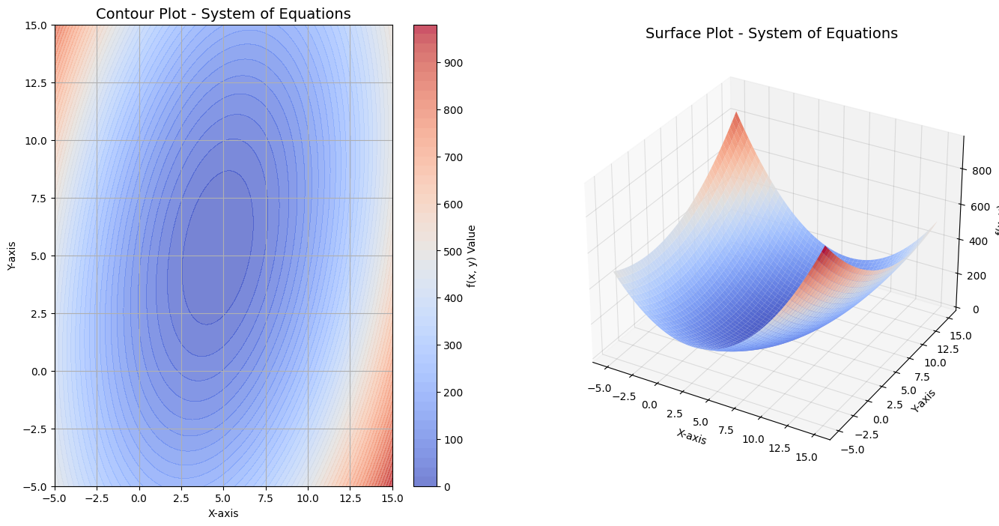

In [2]:
# Define the function f(x, y) based on the system of equations
def f(x, y):
    return (x + y - 10)**2 + (2*x - y - 4)**2  # Sum of squared deviations

# Generate the grid for x and y
x = np.linspace(-5, 15, 200)
y = np.linspace(-5, 15, 200)
X, Y = np.meshgrid(x, y)

# Compute Z values for the function f(x, y)
Z = f(X, Y)

# Create the figure
fig = plt.figure(figsize=(16, 8))
fig.tight_layout()

# Subplots
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122, projection="3d")

# Contour Plot (2D)
contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.7)
ax1.set_title('Contour Plot - System of Equations', fontsize=14)
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
fig.colorbar(contour, ax=ax1, label='f(x, y) Value')

# Surface Plot (3D)
surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.9)
ax2.set_title('Surface Plot - System of Equations', fontsize=14)
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')
ax2.set_zlabel('f(x, y)')

# Gridlines for both plots
ax1.grid(True)
ax2.grid(True)

# Adjust 3D gridlines appearance (making them lighter)
ax2.xaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))  # Set grid color for 3D plot
ax2.yaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))
ax2.zaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))

# Display the plot
plt.show()

# Gradient Descent Animation System of Equations

This code demonstrates the Gradient Descent algorithm applied to a bowl-shaped quadratic function. The function represents a convex optimization problem, commonly used to illustrate gradient descent.

### Features:
- **Customizable Parameters**: Modify the initial point, learning rate, and number of steps to explore different gradient descent paths and convergence behavior.
- **Animation Output**: The animation shows the descent process in both 2D (contour) and 3D (surface) views. Make sure to set the correct file path in `anim.save(r'PATH')` on line 105 to save the animation as a `.gif`.

Experiment with these parameters to visualize and understand how gradient descent works in different scenarios.

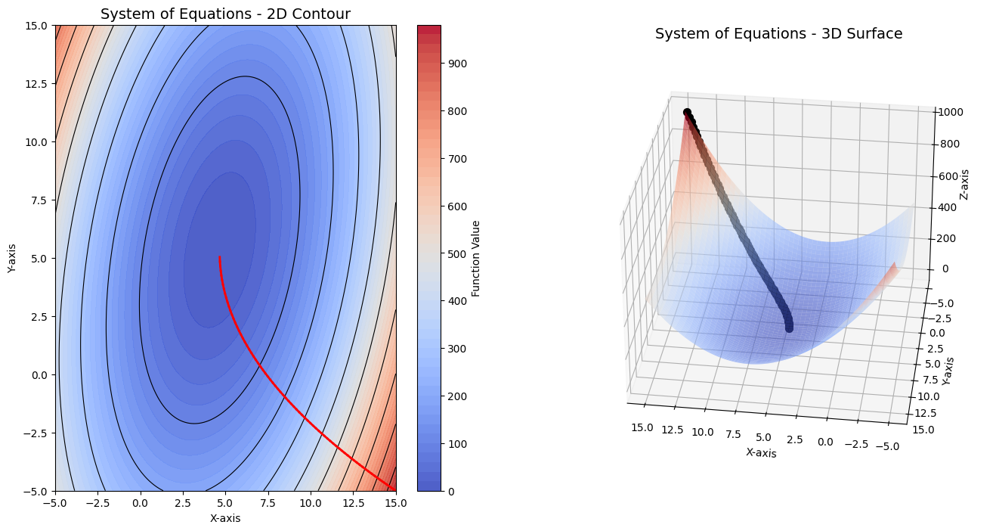

In [3]:
# Define the system of linear equations (f(x, y))
def system_of_equations(x, y):
    return (x + y - 10)**2 + (2*x - y - 4)**2  # Sum of squared deviations

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    df_dx = 2 * (x + y - 10) + 4 * (x - 0.5 * y - 2)  # Partial derivative w.r.t. x
    df_dy = 2 * (x + y - 10) - 2 * (x - 0.5 * y - 2)  # Partial derivative w.r.t. y
    return np.array([df_dx, df_dy])

# Define the animation function
def animate(fun):
    n = fun.n + 1  # Number of steps for gradient descent
    xstart, xend = fun.xrange  # X range for the plot
    ystart, yend = fun.yrange  # Y range for the plot
    rate = fun.rate  # Learning rate
    m = fun.count  # Resolution of the plot grid
    title = "f(x, y) = " + fun.name
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # Set up the figure and 3D axes with an increased figure size
    fig = plt.figure(figsize=(16, 8))  # Increased figure size
    fig.tight_layout()
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122, projection="3d")
    ax1.set_title('System of Equations - 2D Contour', fontsize=14)
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')
    ax2.set_title('System of Equations - 3D Surface', fontsize=14)
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Z-axis')

    # Contour plot for 2D
    contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.9)
    contour_lines = ax1.contour(X, Y, Z, levels=10, colors='black', linewidths=0.8)
    fig.colorbar(contour, ax=ax1, label='Function Value')

    # Surface plot for 3D
    surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.6)

    # Initialize the starting point for the animation
    def init():
        xdata[0], ydata[0] = fun.init_point
        zdata[0] = get(xdata[0], ydata[0])

    # Update the function at each step
    def update(i):
        u = xdata[i]
        v = ydata[i]
        z = zdata[i]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        if round(d_len, 4) > 0:
            xdata[i + 1] = u - d_x / d_len * rate  # New x coordinate after update
            ydata[i + 1] = v - d_y / d_len * rate  # New y coordinate after update
            zdata[i + 1] = get(u, v)  # New z value after update

            # Plot path on the 3D surface in red color
            ax2.plot(
                [u, xdata[i + 1]],
                [v, ydata[i + 1]],
                [z, zdata[i + 1]],
                lw=3,
                color="red",
                zorder=2,
            )
            # Plot path on the 2D contour
            ax1.plot([u, xdata[i + 1]], [v, ydata[i + 1]], color="red", lw=2)

            # Plot the red dot for the current position with smaller ball size
            ax2.scatter(xdata[i + 1], ydata[i + 1], zdata[i + 1], color='black', s=50, zorder=3)  # Smaller ball size

        # Update 3D plot rotation to create the 90-degree rotation effect
        # Adjust the azim parameter to rotate the plot during animation
        ax2.view_init(elev=30, azim=10 + (i / n) * 90)

    # Create the animation
    anim = animation.FuncAnimation(
        fig, update, frames=range(n - 1), init_func=init, repeat=False
    )

    # Save the animation to a file
    anim.save(r'D:/Optimisation lab (SEM-3)/Gradient Descent/gradient1.gif', writer='pillow', fps=2)

    plt.show()

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "System of Equations"
        self.n = steps  # Number of gradient descent steps
        self.xrange = (-5, 15)  # Range for x axis
        self.yrange = (-5, 15)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.1  
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([7, 2])
        
    def get(self, x, y):
        return system_of_equations(x, y)  # Function value at (x, y)
    
    def dx(self, x, y):
        return 2 * (x + y - 10) + 4 * (x - 0.5 * y - 2)  # Derivative with respect to x

    def dy(self, x, y):
        return 2 * (x + y - 10) - 2 * (x - 0.5 * y - 2)  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Example of how to call the animate function with custom values
init_point = np.array([15, -5])  # Custom initial point (X, Y)
learning_rate = 0.2  # Custom learning rate
steps = 75  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
animate(fun)

This is an interactive tool that visualizes the **gradient descent** process. It shows how the algorithm moves toward the minimum of a function in 3D space. You can hover over the points to view their coordinates and the function values at each iteration. The plot is fully interactive, allowing you to zoom, rotate, and explore the descent from different angles.

In [4]:
# Define the system of equations (f(x, y))
def system_of_equations(x, y):
    return (x + y - 10)**2 + (2*x - y - 4)**2  # Sum of squared deviations

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    df_dx = 2 * (x + y - 10) + 4 * (x - 0.5 * y - 2)  # Partial derivative w.r.t. x
    df_dy = 2 * (x + y - 10) - 2 * (x - 0.5 * y - 2)  # Partial derivative w.r.t. y
    return np.array([df_dx, df_dy])

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "System of Linear Equations"
        self.n = steps  # Number of gradient descent steps
        self.xrange = (-5, 15)  # Range for x axis
        self.yrange = (-5, 15)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.1  # Learning rate
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([7, 2])  # Starting point for gradient descent
        
    def get(self, x, y):
        return system_of_equations(x, y)  # Function value at (x, y)
    
    def dx(self, x, y):
        return 2 * (x + y - 10) + 4 * (x - 0.5 * y - 2)  # Derivative with respect to x

    def dy(self, x, y):
        return 2 * (x + y - 10) - 2 * (x - 0.5 * y - 2)  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Gradient descent simulation with Plotly visualization
def run_gradient_descent_plotly(fun):
    n = fun.n + 1  # Number of steps for gradient descent
    rate = fun.rate  # Learning rate
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function
    rdigit = 4  # Precision for debug printing

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Set the initial point
    xdata[0], ydata[0] = fun.init_point[0], fun.init_point[1]
    zdata[0] = get(xdata[0], ydata[0])  # Function value at the initial point

    # Create grid for plotting
    x = np.linspace(fun.xrange[0], fun.xrange[1], fun.count)
    y = np.linspace(fun.yrange[0], fun.yrange[1], fun.count)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # Create the figure using Plotly
    fig = go.Figure()

    # Add the surface plot (3D plot) with lighter 'Viridis' color scale
    fig.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale='YlGnBu', colorbar=dict(title="Function Value")))

    # Add initial point
    fig.add_trace(go.Scatter3d(
        x=[fun.init_point[0]], y=[fun.init_point[1]], z=[get(fun.init_point[0], fun.init_point[1])],
        mode='markers', marker=dict(size=5, color='red')
    ))

    # Perform gradient descent and add each step to the plot
    for i in range(1, n):
        u = xdata[i - 1]
        v = ydata[i - 1]
        z = zdata[i - 1]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        if round(d_len, rdigit) > 0:
            # Update the next point based on the gradient descent rule
            xdata[i] = u - (d_x / d_len) * rate  # Update x coordinate
            ydata[i] = v - (d_y / d_len) * rate  # Update y coordinate
            zdata[i] = get(xdata[i], ydata[i])  # Update z value after the step

            # Add the updated point to the plot
            fig.add_trace(go.Scatter3d(
                x=[xdata[i]], y=[ydata[i]], z=[zdata[i]],
                mode='markers', marker=dict(size=5, color='black')
            ))

            # Add a line showing the path taken by gradient descent
            fig.add_trace(go.Scatter3d(
                x=[u, xdata[i]], y=[v, ydata[i]], z=[z, zdata[i]],
                mode='lines', line=dict(color='red', width=3)
            ))

    # Update the layout to make the plot interactive
    fig.update_layout(
        title='Gradient Descent Path - System of Equations',
        scene=dict(
            xaxis_title='X-axis',
            yaxis_title='Y-axis',
            zaxis_title='Z-axis'
        ),
        autosize=True,
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Show the plot
    fig.show()

# Example usage
init_point = np.array([15, -5])  # Custom initial point (X, Y)
learning_rate = 0.2  # Custom learning rate
steps = 75  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
run_gradient_descent_plotly(fun)

### Visualizing a Function with a Single Minima

This script defines a function with a **single local and global minimum** and visualizes it using both 2D contour and 3D surface plots.

- **Function**: The function used is \( f(x, y) = (x - 3)^2 + (y + 2)^2 \), which represents a **bowl-shaped surface** with a minimum at \( (3, -2) \).
  
- **2D Contour Plot**: Displays level curves of the function, highlighting areas with the same function value. This helps visualize how the function changes in the \( x \)-\( y \) plane.

- **3D Surface Plot**: Shows the complete shape of the function in three dimensions, providing a clearer view of the landscape and how the function behaves near the minimum.

The plots are created using `Matplotlib`, and the grid resolution ensures smooth and detailed visualization of the function's surface and contours.

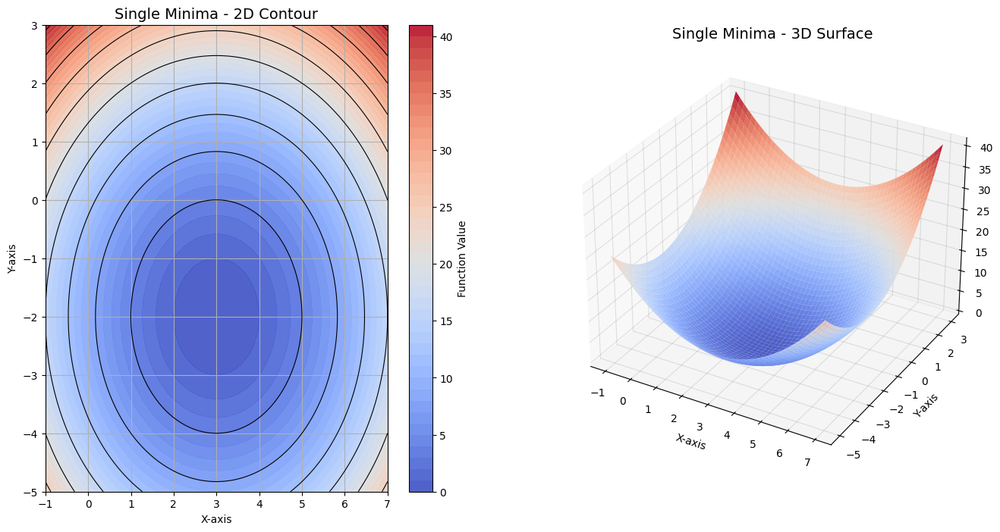

In [5]:
# Define the function (Single Local and Global Minima)
def single_minima(x, y):
    return (x - 3)**2 + (y + 2)**2

# Generate the grid
x = np.linspace(-1, 7, 200)
y = np.linspace(-5, 3, 200)
X, Y = np.meshgrid(x, y)
Z = single_minima(X, Y)

# Create the figure with increased size
fig = plt.figure(figsize=(16, 8))
fig.tight_layout()

# Create subplots
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122, projection="3d")

# Contour Plot (2D) with visible contour lines
contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.9)  # Smooth color with coolwarm cmap
contour_lines = ax1.contour(X, Y, Z, levels=10, colors='black', linewidths=0.8)  # Contour lines
ax1.set_title('Single Minima - 2D Contour', fontsize=14)
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
fig.colorbar(contour, ax=ax1, label='Function Value')

# Surface Plot (3D) without gridlines, same color as contour plot
surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.9)

# Set labels for the 3D plot
ax2.set_title('Single Minima - 3D Surface', fontsize=14)
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')
ax2.set_zlabel('Z-axis')

# Gridlines for both plots (like second plot)
ax1.grid(True)
ax2.grid(True)

# Adjust the appearance of 3D plot gridlines (making them lighter)
ax2.xaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))  # Set grid color for 3D plot
ax2.yaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))
ax2.zaxis._axinfo['grid'].update(color=(0, 0, 0, 0.1))

# Display the plot
plt.show()

### Visualizing Gradient Descent on a Single Minima Function

This script demonstrates **gradient descent** applied to a **bowl-shaped function** with a **single local and global minimum** at \( (3, -2) \). The function used is:

\[
f(x, y) = (x - 3)^2 + (y + 2)^2
\]

- **Gradient Descent Path**: The animation shows how gradient descent updates the points step-by-step. The red path visualizes the journey taken by the algorithm toward the minimum.
- **Customizable Steps and Learning Rate**: You can modify the number of steps and learning rate for smoother or faster convergence.
- **Animation Output**: The animation shows the descent process in both 2D (contour) and 3D (surface) views. Make sure to set the correct file path in `anim.save(r'PATH')` to save the animation as a `.gif`.
  
The animation illustrates how gradient descent converges toward the minimum, with customizable settings for a clearer visualization.

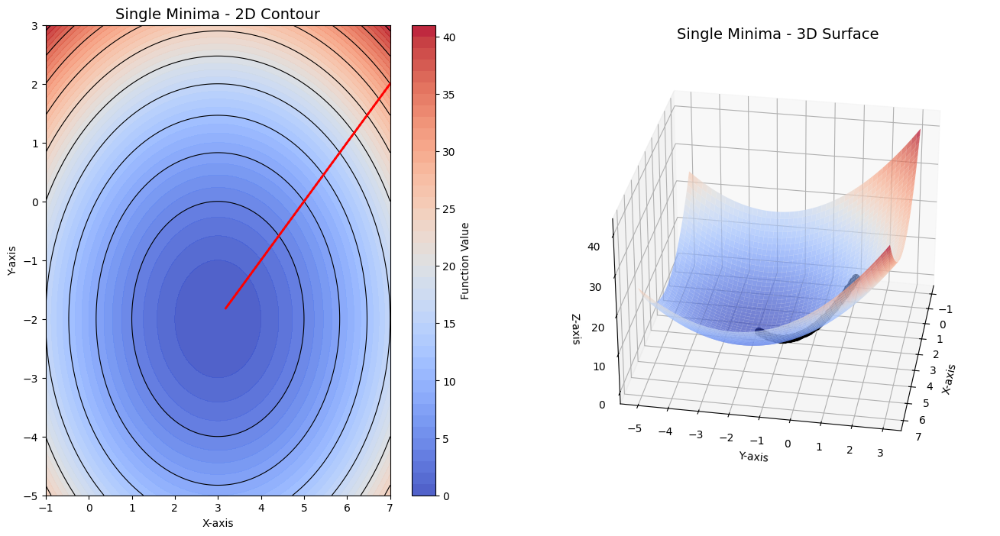

In [6]:
# Define the function (Single Local and Global Minima)
def single_minima(x, y):
    return (x - 3)**2 + (y + 2)**2

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    dx = 2 * (x - 3)  # Partial derivative with respect to x
    dy = 2 * (y + 2)  # Partial derivative with respect to y
    return np.array([dx, dy])

# Define the animation function
def animate(fun, debug=False):
    n = fun.n + 1  # Number of steps for gradient descent
    xstart, xend = fun.xrange  # X range for the plot
    ystart, yend = fun.yrange  # Y range for the plot
    rate = fun.rate  # Learning rate
    m = fun.count  # Resolution of the plot grid
    title = "f(x, y) = " + fun.name  # Function title
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function
    rdigit = 4  # Precision for debug printing

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # Set up the figure and 3D axes with an increased figure size
    fig = plt.figure(figsize=(16, 8))  # Increased figure size
    fig.tight_layout()
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122, projection="3d")
    ax1.set_title('Single Minima - 2D Contour', fontsize=14)
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')
    ax2.set_title('Single Minima - 3D Surface', fontsize=14)
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Z-axis')

    # Contour plot for 2D
    contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.9)
    contour_lines = ax1.contour(X, Y, Z, levels=10, colors='black', linewidths=0.8)
    fig.colorbar(contour, ax=ax1, label='Function Value')

    # Surface plot for 3D
    surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.7)

    # Initialize the starting point for the animation
    def init():
        xdata[0], ydata[0] = fun.init_point
        zdata[0] = get(xdata[0], ydata[0])

    # Update the function at each step
    def update(i):
        u = xdata[i]
        v = ydata[i]
        z = zdata[i]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        # if debug:
            # print(i, round(u, rdigit), round(v, rdigit), round(z, rdigit))

        if round(d_len, rdigit) > 0:
            xdata[i + 1] = u - d_x / d_len * rate  # New x coordinate after update
            ydata[i + 1] = v - d_y / d_len * rate  # New y coordinate after update
            zdata[i + 1] = get(u, v)  # New z value after update

            # Plot path on the 3D surface in red color
            ax2.plot(
                [u, xdata[i + 1]],
                [v, ydata[i + 1]],
                [z, zdata[i + 1]],
                lw=3,
                color="red",
                zorder=2,
            )
            # Plot path on the 2D contour
            ax1.plot([u, xdata[i + 1]], [v, ydata[i + 1]], color="red", lw=2)

            # Plot the red dot for the current position with smaller ball size
            ax2.scatter(xdata[i + 1], ydata[i + 1], zdata[i + 1], color='black', s=50, zorder=3)  # Smaller ball size

        # Update 3D plot rotation for better visual effect
        ax2.view_init(azim=0 + 10 * i / n)  # Slow down rotation for better visualization

    # Create the animation
    anim = animation.FuncAnimation(
        fig, update, frames=range(n - 1), init_func=init, repeat=False
    )

    # Save the animation to a file
    anim.save(r'D:/Optimisation lab (SEM-3)/Gradient Descent/gradient2.gif', writer='pillow', fps=2)

    plt.show()

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "Single Minima"
        self.n = steps  # Number of gradient descent steps
        self.xrange = (-1, 7)  # Range for x axis
        self.yrange = (-5, 3)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.1  # Learning rate
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([5, -1])  # Starting point for gradient descent
        
    def get(self, x, y):
        return single_minima(x, y)  # Function value at (x, y)
    
    def dx(self, x, y):
        return 2 * (x - 3)  # Derivative with respect to x

    def dy(self, x, y):
        return 2 * (y + 2)  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Example of how to call the animate function with custom values
init_point = np.array([7, 2])  # Custom initial point (X, Y)
learning_rate = 0.09  # Custom learning rate
steps = 60  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
animate(fun, debug=True)

This is an interactive tool that visualizes the **gradient descent** process. It shows how the algorithm moves toward the minimum of a function in 3D space. You can hover over the points to view their coordinates and the function values at each iteration. The plot is fully interactive, allowing you to zoom, rotate, and explore the descent from different angles.

In [7]:
# Define the function (Single Local and Global Minima)
def single_minima(x, y):
    return (x - 3)**2 + (y + 2)**2

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    dx = 2 * (x - 3)  # Partial derivative with respect to x
    dy = 2 * (y + 2)  # Partial derivative with respect to y
    return np.array([dx, dy])

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "Single Minima"
        self.n = steps  # Number of gradient descent steps (customizable)
        self.xrange = (-1, 7)  # Range for x axis
        self.yrange = (-5, 3)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.1  # Learning rate (customizable)
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([5, -1])  # Starting point for gradient descent (customizable)
        
    def get(self, x, y):
        return single_minima(x, y)  # Function value at (x, y)
    
    def dx(self, x, y):
        return 2 * (x - 3)  # Derivative with respect to x

    def dy(self, x, y):
        return 2 * (y + 2)  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Gradient descent simulation with Plotly visualization
def run_gradient_descent_plotly(fun, debug=False):
    n = fun.n + 1  # Number of steps for gradient descent
    rate = fun.rate  # Learning rate
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function
    rdigit = 4  # Precision for debug printing

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Set the initial point
    xdata[0], ydata[0] = fun.init_point[0], fun.init_point[1]
    zdata[0] = get(xdata[0], ydata[0])  # Function value at the initial point

    # Create grid for plotting
    x = np.linspace(fun.xrange[0], fun.xrange[1], fun.count)
    y = np.linspace(fun.yrange[0], fun.yrange[1], fun.count)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # Create the figure using Plotly
    fig = go.Figure()

    # Add the surface plot (3D plot) with lighter 'Viridis' color scale
    fig.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale='YlGnBu', colorbar=dict(title="Function Value")))

    # Add initial point
    fig.add_trace(go.Scatter3d(
        x=[fun.init_point[0]], y=[fun.init_point[1]], z=[get(fun.init_point[0], fun.init_point[1])],
        mode='markers', marker=dict(size=5, color='red')
    ))

    # Perform gradient descent and add each step to the plot
    for i in range(1, n):
        u = xdata[i - 1]
        v = ydata[i - 1]
        z = zdata[i - 1]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        if round(d_len, rdigit) > 0:
            # Update the next point based on the gradient descent rule
            xdata[i] = u - (d_x / d_len) * rate  # Update x coordinate
            ydata[i] = v - (d_y / d_len) * rate  # Update y coordinate
            zdata[i] = get(xdata[i], ydata[i])  # Update z value after the step

            # Add the updated point to the plot
            fig.add_trace(go.Scatter3d(
                x=[xdata[i]], y=[ydata[i]], z=[zdata[i]],
                mode='markers', marker=dict(size=5, color='black')
            ))

            # Add a line showing the path taken by gradient descent
            fig.add_trace(go.Scatter3d(
                x=[u, xdata[i]], y=[v, ydata[i]], z=[z, zdata[i]],
                mode='lines', line=dict(color='red', width=3)
            ))

    # Update the layout to make the plot interactive
    fig.update_layout(
        title='Single Minima - Gradient Descent Path',
        scene=dict(
            xaxis_title='X-axis',
            yaxis_title='Y-axis',
            zaxis_title='Z-axis'
        ),
        autosize=True,
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Show the plot
    fig.show()

# Example usage
init_point = np.array([7, 2])  # Custom initial point (X, Y)
learning_rate = 0.08  # Custom learning rate
steps = 60  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
run_gradient_descent_plotly(fun, debug=True)

### Visualizing a Complex Function

This script visualizes a **complex function** with one global minimum and two local minima using both **2D contour** and **3D surface plots**. The function is:

- **2D Contour Plot**: Displays level curves that show regions of equal function values, highlighting the local and global minima. The black contour lines represent the steepest descent paths.
- **3D Surface Plot**: Provides a clearer view of the function's landscape, showing how the function behaves across the x and y axes.
- **Minima**: The function has one **global minimum** and two **local minima**, which are visible in both plots.

This visualization helps in understanding how the function behaves in terms of optimization, particularly identifying minima and the function's landscape.

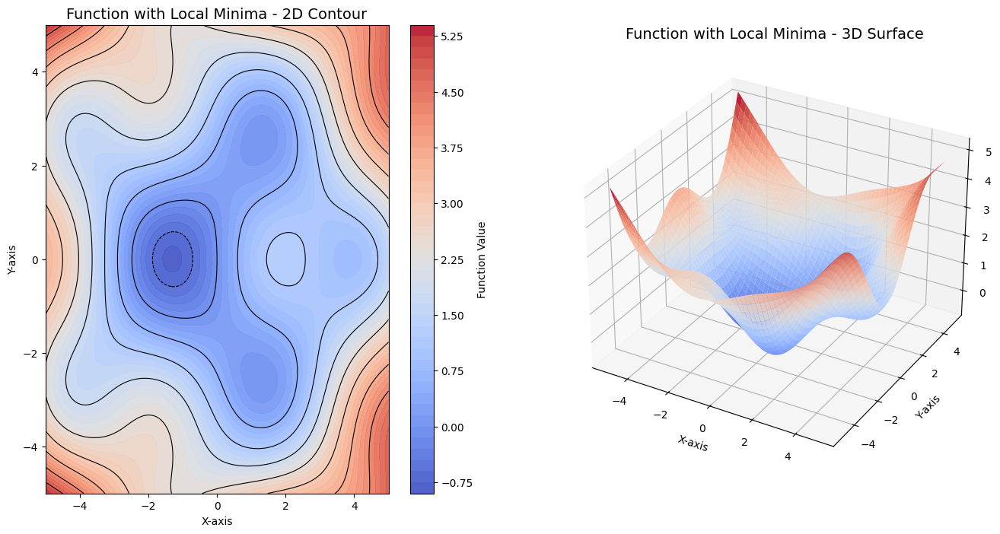

In [8]:
# Define the function (One Global Minima and Two Local Minima)
def complex_function(x, y):
    return np.sin(x) * np.cos(y) + 0.1 * (x**2 + y**2)

# Create a grid for the function surface
x = np.linspace(-5, 5, 200)
y = np.linspace(-5, 5, 200)
X, Y = np.meshgrid(x, y)
Z = complex_function(X, Y)

# Create the figure
fig = plt.figure(figsize=(16, 8))
fig.tight_layout()

# Create subplots
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122, projection="3d")
ax1.set_title('Function with Local Minima - 2D Contour', fontsize=14)
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Y-axis')
ax2.set_title('Function with Local Minima - 3D Surface', fontsize=14)
ax2.set_xlabel('X-axis')
ax2.set_ylabel('Y-axis')
ax2.set_zlabel('Z-axis')

# Contour plot for 2D
contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.9)
contour_lines = ax1.contour(X, Y, Z, levels=10, colors='black', linewidths=0.8)
fig.colorbar(contour, ax=ax1, label='Function Value')

# Surface plot for 3D
surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.9)

# Display the plot
plt.show()

### Visualizing Gradient Descent on a Complex Function

This script demonstrates **gradient descent** applied to a **complex function** with **one global minimum** and **two local minima**.

- **Gradient Descent Path**: The animation shows how gradient descent updates the points step-by-step. The path visualizes the journey taken by the algorithm toward the minimum.
- **Customizable Steps and Learning Rate**: You can modify the number of steps and learning rate for smoother or faster convergence.
- **Initial Point**: The choice of initial point influences whether the algorithm converges to the **global minimum** or one of the **local minima**. Testing different starting points helps ensure finding the global minimum.
- **Animation Output**: The animation shows the descent process in both 2D (contour) and 3D (surface) views. Make sure to set the correct file path in `anim.save(r'PATH')` save the animation as a `.gif`.

The animation illustrates how gradient descent converges toward the minimum, with customizable settings for a clearer visualization.

0 -5.0 4.0 3.4732
1 -4.9386 3.921 3.4732
2 -4.8771 3.8422 3.2833
3 -4.8154 3.7635 3.1008
4 -4.7536 3.6849 2.9268
5 -4.6918 3.6063 2.7622
6 -4.63 3.5277 2.6081
7 -4.5682 3.4491 2.4649
8 -4.5064 3.3704 2.3332
9 -4.4447 3.2917 2.2134
10 -4.3832 3.2129 2.1056
11 -4.3216 3.1341 2.0096
12 -4.2601 3.0552 1.9253
13 -4.1986 2.9764 1.8522
14 -4.1368 2.8978 1.7897
15 -4.0747 2.8194 1.737
16 -4.0118 2.7417 1.6931
17 -3.9478 2.6648 1.657
18 -3.8824 2.5892 1.6275
19 -3.8153 2.5151 1.6032
20 -3.7465 2.4425 1.5828
21 -3.6766 2.3709 1.5649
22 -3.6062 2.3 1.5481
23 -3.5355 2.2292 1.5309
24 -3.4648 2.1584 1.5121
25 -3.3941 2.0877 1.4903
26 -3.3234 2.017 1.4644
27 -3.2527 1.9463 1.4333
28 -3.182 1.8756 1.3962
29 -3.1113 1.8049 1.3522
30 -3.0406 1.7342 1.3008
31 -2.9699 1.6634 1.2417
32 -2.8992 1.5927 1.1745
33 -2.8285 1.522 1.0995
34 -2.7578 1.4513 1.0167
35 -2.687 1.3806 0.9265
36 -2.6163 1.3099 0.8296
37 -2.5456 1.2392 0.7268
38 -2.4749 1.1685 0.6188
39 -2.4042 1.0978 0.5069
40 -2.3335 1.0271 0.3922
41 

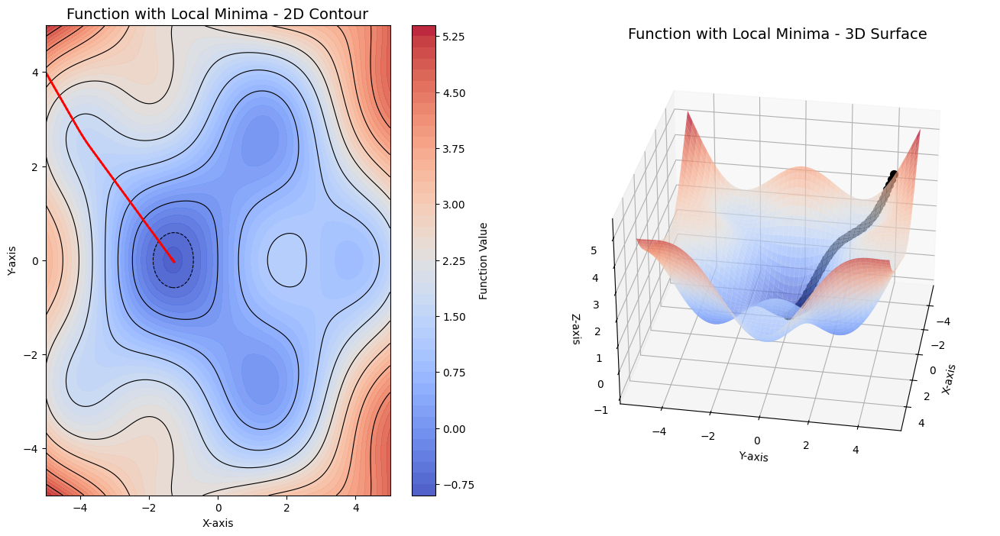

In [9]:
# Define the function (One Global Minima and Two Local Minima)
def complex_function(x, y):
    return np.sin(x) * np.cos(y) + 0.1 * (x**2 + y**2)

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    dx = np.cos(x) * np.cos(y) + 0.2 * x  # Partial derivative with respect to x
    dy = -np.sin(x) * np.sin(y) + 0.2 * y  # Partial derivative with respect to y
    return np.array([dx, dy])

# Define the animation function
def animate(fun, debug=False):
    n = fun.n + 1  # Number of steps for gradient descent
    xstart, xend = fun.xrange  # X range for the plot
    ystart, yend = fun.yrange  # Y range for the plot
    rate = fun.rate  # Learning rate
    m = fun.count  # Resolution of the plot grid
    title = "f(x, y) = " + fun.name  # Function title
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function
    rdigit = 4  # Precision for debug printing

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # Set up the figure and 3D axes with an increased figure size
    fig = plt.figure(figsize=(16, 8))  # Increased figure size
    fig.tight_layout()
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122, projection="3d")
    ax1.set_title('Function with Local Minima - 2D Contour', fontsize=14)
    ax1.set_xlabel('X-axis')
    ax1.set_ylabel('Y-axis')
    ax2.set_title('Function with Local Minima - 3D Surface', fontsize=14)
    ax2.set_xlabel('X-axis')
    ax2.set_ylabel('Y-axis')
    ax2.set_zlabel('Z-axis')

    # Contour plot for 2D
    contour = ax1.contourf(X, Y, Z, levels=50, cmap='coolwarm', alpha=0.9)
    contour_lines = ax1.contour(X, Y, Z, levels=10, colors='black', linewidths=0.8)
    fig.colorbar(contour, ax=ax1, label='Function Value')

    # Surface plot for 3D
    surface = ax2.plot_surface(X, Y, Z, cmap='coolwarm', alpha=0.7)

    # Initialize the starting point for the animation
    def init():
        xdata[0], ydata[0] = fun.init_point
        zdata[0] = get(xdata[0], ydata[0])

    # Update the function at each step
    def update(i):
        u = xdata[i]
        v = ydata[i]
        z = zdata[i]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        if debug:
            print(i, round(u, rdigit), round(v, rdigit), round(z, rdigit))

        if round(d_len, rdigit) > 0:
            xdata[i + 1] = u - d_x / d_len * rate  # New x coordinate after update
            ydata[i + 1] = v - d_y / d_len * rate  # New y coordinate after update
            zdata[i + 1] = get(u, v)  # New z value after update

            # Plot path on the 3D surface in red color
            ax2.plot(
                [u, xdata[i + 1]],
                [v, ydata[i + 1]],
                [z, zdata[i + 1]],
                lw=3,
                color="red",
                zorder=2,
            )
            # Plot path on the 2D contour
            ax1.plot([u, xdata[i + 1]], [v, ydata[i + 1]], color="red", lw=2)

            # Plot the red dot for the current position with smaller ball size
            ax2.scatter(xdata[i + 1], ydata[i + 1], zdata[i + 1], color='black', s=50, zorder=3)  # Smaller ball size

        # Update 3D plot rotation for better visual effect
        ax2.view_init(azim=0 + 10 * i / n)  # Slow down rotation for better visualization

    # Create the animation
    anim = animation.FuncAnimation(
        fig, update, frames=range(n - 1), init_func=init, repeat=False
    )

    # Save the animation to a file
    anim.save(r'D:/Optimisation lab (SEM-3)/Gradient Descent/gradient3.gif', writer='pillow', fps=2)

    plt.show()

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "Function with Local Minima"
        self.n = steps  # Number of gradient descent steps
        self.xrange = (-5, 5)  # Range for x axis
        self.yrange = (-5, 5)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.05  # Learning rate
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([4, -4])  # Starting point for gradient descent
        
    def get(self, x, y):
        return complex_function(x, y)  # Function value at (x, y)
    
    def dx(self, x, y):
        return np.cos(x) * np.cos(y) + 0.2 * x  # Derivative with respect to x

    def dy(self, x, y):
        return -np.sin(x) * np.sin(y) + 0.2 * y  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Example of how to call the animate function with custom values
init_point = np.array([-5, 4])  # Custom initial point (X, Y)
learning_rate = 0.1  # Custom learning rate
steps = 60  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
animate(fun, debug=True)

### Visualizing Gradient Descent on a Complex Function

This script shows how **gradient descent** works on a function with **one global minimum** and **two local minima**.

- **Gradient Descent Path**: The red path on the 2D and 3D plots shows how the algorithm moves towards the minimum.
- **Customizable Settings**: You can adjust the number of steps and learning rate for smoother or faster convergence.
- **Initial Point**: The starting point affects where the algorithm converges — it can lead to a global or local minimum.
- **Interactive Plots**: The 2D and 3D plots are updated in real-time to show the gradient descent process.

This visualization helps you understand how gradient descent works to find the minimum.

In [10]:
# Define the function with one global minima and two local minima
def complex_function(x, y):
    return np.sin(x) * np.cos(y) + 0.1 * (x**2 + y**2)

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    dx = np.cos(x) * np.cos(y) + 0.2 * x  # Partial derivative with respect to x
    dy = -np.sin(x) * np.sin(y) + 0.2 * y  # Partial derivative with respect to y
    return np.array([dx, dy])

# Function wrapper for gradient descent
class FunctionWrapper:
    def __init__(self, init_point=None, learning_rate=None, steps=100):
        self.name = "Function with Local Minima"
        self.n = steps  # Number of gradient descent steps (customizable)
        self.xrange = (-5, 5)  # Range for x axis
        self.yrange = (-5, 5)  # Range for y axis
        self.rate = learning_rate if learning_rate else 0.05  # Learning rate (customizable)
        self.count = 200  # Grid resolution for the plot
        self.init_point = init_point if init_point is not None else np.array([4, -4])  # Starting point for gradient descent (customizable)

    def get(self, x, y):
        return complex_function(x, y)  # Function value at (x, y)

    def dx(self, x, y):
        return np.cos(x) * np.cos(y) + 0.2 * x  # Derivative with respect to x

    def dy(self, x, y):
        return -np.sin(x) * np.sin(y) + 0.2 * y  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y)**2 + self.dy(x, y)**2)  # Gradient magnitude

# Function to plot the gradient descent path (2D and 3D)
def plot_gradient_descent_path(fun):
    n = fun.n + 1  # Number of steps for gradient descent
    xstart, xend = fun.xrange  # X range for the plot
    ystart, yend = fun.yrange  # Y range for the plot
    rate = fun.rate  # Learning rate
    m = fun.count  # Resolution of the plot grid
    get = fun.get  # Function to evaluate Z
    dx = fun.dx  # X derivative function
    dy = fun.dy  # Y derivative function
    dlen = fun.dlen  # Gradient magnitude function

    # Data initialization
    xdata = np.zeros(n)
    ydata = np.zeros(n)
    zdata = np.zeros(n)

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = get(X, Y)

    # 2D Contour plot using Plotly
    contour = go.Figure()
    contour.add_trace(go.Contour(
        z=Z, x=x, y=y, colorscale='RdBu', contours_coloring='lines', opacity=0.8, showscale=True))
    
    # Initialize the starting point for gradient descent
    xdata[0], ydata[0] = fun.init_point
    zdata[0] = get(xdata[0], ydata[0])

    # Perform gradient descent and plot each step
    for i in range(1, n):
        u = xdata[i - 1]
        v = ydata[i - 1]
        z = zdata[i - 1]
        d_x = dx(u, v)  # Gradient in x direction
        d_y = dy(u, v)  # Gradient in y direction
        d_len = dlen(u, v)  # Magnitude of the gradient

        # Update the next point based on the gradient descent rule
        if round(d_len, 4) > 0:
            xdata[i] = u - (d_x / d_len) * rate  # Update x coordinate
            ydata[i] = v - (d_y / d_len) * rate  # Update y coordinate
            zdata[i] = get(xdata[i], ydata[i])  # Update z value after the step

            # Plot the path on the 2D contour
            contour.add_trace(go.Scatter(
                x=[u, xdata[i]], y=[v, ydata[i]], mode='lines', line=dict(color="red", width=2), showlegend=False))

    # 3D Surface plot using Plotly
    surface = go.Figure()
    surface.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale='RdBu', opacity=0.8))

    # Plot gradient descent path on the surface
    for i in range(1, n):
        surface.add_trace(go.Scatter3d(
            x=[xdata[i - 1], xdata[i]],
            y=[ydata[i - 1], ydata[i]],
            z=[zdata[i - 1], zdata[i]],
            mode='lines+markers',
            marker=dict(color='red', size=5),
            line=dict(color='red', width=3),
            showlegend=False))

    # Customize layout for 2D contour plot
    contour.update_layout(
        title="Function with Local Minima - 2D Contour Plot",
        xaxis_title="X-axis",
        yaxis_title="Y-axis",
        autosize=False,
        margin=dict(l=0, r=0, b=0, t=40),
        height=500
    )

    # Customize layout for 3D surface plot
    surface.update_layout(
        title="Function with Local Minima - 3D Surface Plot",
        scene=dict(
            xaxis_title='X-axis',
            yaxis_title='Y-axis',
            zaxis_title='Z-axis'
        ),
        height=500,
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Show both plots
    contour.show()
    surface.show()

# Example usage of the gradient descent function
init_point = np.array([-5, 4])  # Custom initial point (X, Y)
learning_rate = 0.1  # Custom learning rate
steps = 60  # Number of gradient descent steps

fun = FunctionWrapper(init_point=init_point, learning_rate=learning_rate, steps=steps)
plot_gradient_descent_path(fun)

### The code applies gradient descent to a function with a global minimum and two local minima. Different starting points lead to convergence at different minima. The 2D and 3D plots show how each path reaches different minima.

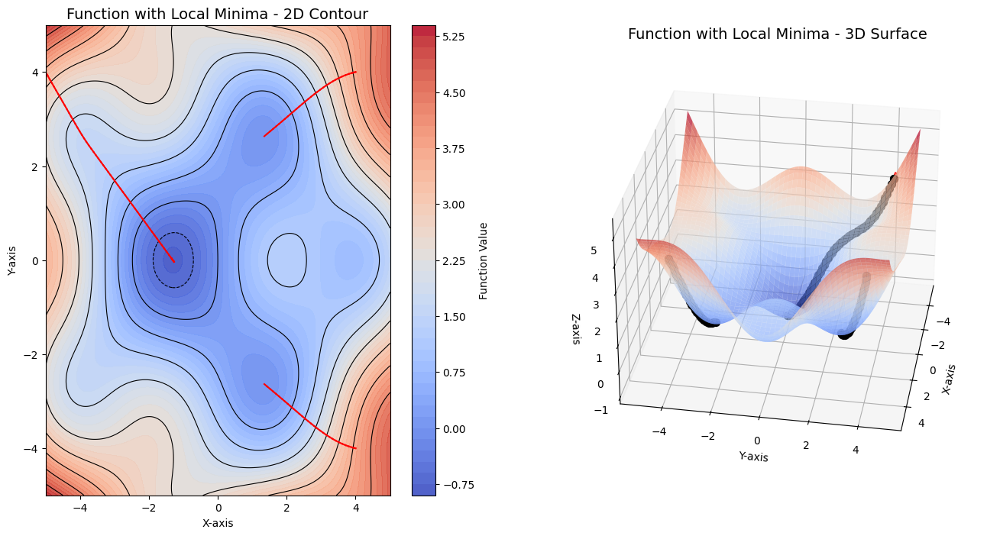

In [11]:
# Define the function (One Global Minima and Two Local Minima)
def complex_function(x, y):
    return np.sin(x) * np.cos(y) + 0.1 * (x**2 + y**2)

# Function wrapper to match the signature of the animation function
class FunctionWrapper:
    def __init__(self, init_points, learning_rates, steps_list):
        self.name = "Function with Local Minima"
        self.n_list = steps_list  # Gradient descent steps for each point
        self.xrange = (-5, 5)  # Range for x axis
        self.yrange = (-5, 5)  # Range for y axis
        self.rates = learning_rates  # Learning rates for each point
        self.count = 200  # Grid resolution for the plot
        self.init_points = init_points  # Starting points for gradient descent

    def get(self, x, y):
        return complex_function(x, y)  # Function value at (x, y)

    def dx(self, x, y):
        return np.cos(x) * np.cos(y) + 0.2 * x  # Derivative with respect to x

    def dy(self, x, y):
        return -np.sin(x) * np.sin(y) + 0.2 * y  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y) ** 2 + self.dy(x, y) ** 2)  # Gradient magnitude


# Define the animation function
def animate(fun):
    points_count = len(fun.init_points)
    max_steps = max(fun.n_list) + 1  # Max steps among all points
    xstart, xend = fun.xrange  # X range for the plot
    ystart, yend = fun.yrange  # Y range for the plot
    m = fun.count  # Resolution of the plot grid

    # Initialize data for each point
    xdata = np.zeros((max_steps, points_count))
    ydata = np.zeros((max_steps, points_count))
    zdata = np.zeros((max_steps, points_count))

    for i, point in enumerate(fun.init_points):
        xdata[0, i], ydata[0, i] = point
        zdata[0, i] = fun.get(xdata[0, i], ydata[0, i])

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = fun.get(X, Y)

    # Set up the figure and axes
    fig = plt.figure(figsize=(16, 8))
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122, projection="3d")
    ax1.set_title("Function with Local Minima - 2D Contour", fontsize=14)
    ax1.set_xlabel("X-axis")
    ax1.set_ylabel("Y-axis")
    ax2.set_title("Function with Local Minima - 3D Surface", fontsize=14)
    ax2.set_xlabel("X-axis")
    ax2.set_ylabel("Y-axis")
    ax2.set_zlabel("Z-axis")

    # Contour plot
    contour = ax1.contourf(X, Y, Z, levels=50, cmap="coolwarm", alpha=0.9)
    contour_lines = ax1.contour(X, Y, Z, levels=10, colors="black", linewidths=0.8)
    fig.colorbar(contour, ax=ax1, label="Function Value")

    # Surface plot
    ax2.plot_surface(X, Y, Z, cmap="coolwarm", alpha=0.7)

    # Update function for animation
    def update(i):
        for j in range(points_count):
            if i < fun.n_list[j]:  # Only update points that haven't finished their steps
                u = xdata[i, j]
                v = ydata[i, j]
                z = zdata[i, j]
                d_x = fun.dx(u, v)
                d_y = fun.dy(u, v)
                d_len = fun.dlen(u, v)

                if d_len > 0:
                    # Update positions
                    rate = fun.rates[j]
                    xdata[i + 1, j] = u - d_x / d_len * rate
                    ydata[i + 1, j] = v - d_y / d_len * rate
                    zdata[i + 1, j] = fun.get(xdata[i + 1, j], ydata[i + 1, j])

                    # Plot paths
                    ax2.plot(
                        [u, xdata[i + 1, j]],
                        [v, ydata[i + 1, j]],
                        [z, zdata[i + 1, j]],
                        lw=2,
                        color="red",
                    )
                    ax1.plot(
                        [u, xdata[i + 1, j]], [v, ydata[i + 1, j]], color="red", lw=1.5
                    )
                    ax2.scatter(
                        xdata[i + 1, j],
                        ydata[i + 1, j],
                        zdata[i + 1, j],
                        color="black",
                        s=50,
                    )

        # Rotate 3D plot
        ax2.view_init(azim=10 * i / max_steps)

    # Create the animation
    anim = animation.FuncAnimation(fig, update, frames=max_steps - 1, repeat=False)

    # Save animation
    anim.save("D:/Optimisation lab (SEM-3)/Gradient Descent/gradient3_updated.gif", writer="pillow", fps=2)
    plt.show()


# Example: Define multiple points with separate learning rates and steps
init_points = [
    np.array([-5, 4]),
    np.array([4, 4]),
    np.array([4, -4]),
]
learning_rates = [0.1, 0.1, 0.1]  # Different learning rates for each point
steps_list = [60, 30, 30]  # Different number of steps for each point

fun = FunctionWrapper(init_points, learning_rates, steps_list)
animate(fun)

In [12]:
# Define the function with one global minima and two local minima
def complex_function(x, y):
    return np.sin(x) * np.cos(y) + 0.1 * (x**2 + y**2)

# Gradient of the function (Partial Derivatives)
def gradient(x, y):
    dx = np.cos(x) * np.cos(y) + 0.2 * x  # Partial derivative with respect to x
    dy = -np.sin(x) * np.sin(y) + 0.2 * y  # Partial derivative with respect to y
    return np.array([dx, dy])

# Function wrapper for gradient descent
class FunctionWrapper:
    def __init__(self, init_points, learning_rates, steps_list):
        self.name = "Function with Local Minima"
        self.n_list = steps_list  # Gradient descent steps for each point
        self.xrange = (-5, 5)  # Range for x axis
        self.yrange = (-5, 5)  # Range for y axis
        self.rates = learning_rates  # Learning rates for each point
        self.count = 200  # Grid resolution for the plot
        self.init_points = init_points  # Starting points for gradient descent

    def get(self, x, y):
        return complex_function(x, y)  # Function value at (x, y)

    def dx(self, x, y):
        return np.cos(x) * np.cos(y) + 0.2 * x  # Derivative with respect to x

    def dy(self, x, y):
        return -np.sin(x) * np.sin(y) + 0.2 * y  # Derivative with respect to y

    def dlen(self, x, y):
        return np.sqrt(self.dx(x, y) ** 2 + self.dy(x, y) ** 2)  # Gradient magnitude

# Interactive Plot with Gradient Descent Path
def interactive_plot(fun):
    xstart, xend = fun.xrange
    ystart, yend = fun.yrange
    m = fun.count

    # Create grid for plotting
    x = np.linspace(xstart, xend, m)
    y = np.linspace(ystart, yend, m)
    X, Y = np.meshgrid(x, y)
    Z = fun.get(X, Y)

    # 2D Contour plot using Plotly
    contour = go.Figure()
    contour.add_trace(go.Contour(
        z=Z, x=x, y=y, colorscale='RdBu', contours_coloring='lines', opacity=0.8, showscale=True))

    # 3D Surface plot using Plotly
    surface = go.Figure()
    surface.add_trace(go.Surface(z=Z, x=X, y=Y, colorscale='RdBu', opacity=0.8))

    # Perform gradient descent for each point and plot paths
    for idx, (init_point, rate, steps) in enumerate(zip(fun.init_points, fun.rates, fun.n_list)):
        xdata = np.zeros(steps)
        ydata = np.zeros(steps)
        zdata = np.zeros(steps)

        # Initialize the starting point
        xdata[0], ydata[0] = init_point
        zdata[0] = fun.get(xdata[0], ydata[0])

        # Perform gradient descent
        for i in range(1, steps):
            u, v = xdata[i - 1], ydata[i - 1]
            d_x, d_y = fun.dx(u, v), fun.dy(u, v)
            d_len = fun.dlen(u, v)

            if d_len > 0:
                xdata[i] = u - d_x / d_len * rate
                ydata[i] = v - d_y / d_len * rate
                zdata[i] = fun.get(xdata[i], ydata[i])

        # Add gradient descent path to contour plot
        contour.add_trace(go.Scatter(
            x=xdata, y=ydata, mode='lines+markers',
            line=dict(color="red", width=2),
            marker=dict(color="red", size=5),
            name=f"Path {idx + 1}"
        ))

        # Add gradient descent path to surface plot
        surface.add_trace(go.Scatter3d(
            x=xdata, y=ydata, z=zdata, mode='lines+markers',
            line=dict(color="red", width=3),
            marker=dict(color="red", size=5),
            name=f"Path {idx + 1}"
        ))

    # Customize layout for 2D contour plot
    contour.update_layout(
        title="Function with Local Minima - 2D Contour Plot",
        xaxis_title="X-axis",
        yaxis_title="Y-axis",
        autosize=False,
        margin=dict(l=0, r=0, b=0, t=40),
        height=500
    )

    # Customize layout for 3D surface plot
    surface.update_layout(
        title="Function with Local Minima - 3D Surface Plot",
        scene=dict(
            xaxis_title='X-axis',
            yaxis_title='Y-axis',
            zaxis_title='Z-axis'
        ),
        height=500,
        margin=dict(l=0, r=0, b=0, t=40)
    )

    # Show both plots
    contour.show()
    surface.show()

# Example usage of the gradient descent function
init_points = [np.array([-5, 4]), np.array([4, 4]), np.array([4, -4])]  # Initial points
learning_rates = [0.1, 0.1, 0.1]  # Custom learning rates for each point
steps_list = [60, 30, 30]  # Gradient descent steps for each point

fun = FunctionWrapper(init_points=init_points, learning_rates=learning_rates, steps_list=steps_list)
interactive_plot(fun)